# 加载与函数

In [1]:
import plotly.graph_objects as go
import datetime
from datetime import datetime
import random
import calendar
import time
import tensorflow as tf
from sklearn import svm
from subprocess import call
from scipy import signal
from sklearn import tree
import sklearn
from matplotlib.lines import Line2D
import statsmodels.tsa.stattools as ts
import matplotlib.ticker as mtick
import matplotlib.collections as collections
from numpy import linalg
from IPython.display import Image
import os
import graphviz
import sys
import csv
import pandas as pd 
import statsmodels.formula.api as smf
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs
from arch import arch_model

import numpy as np
import warnings
from sklearn.tree import export_graphviz
from sklearn import datasets
warnings.filterwarnings("ignore")
import math
import operator
import statsmodels.api as sm
import statsmodels.tsa.stattools as ts
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import matplotlib.font_manager as fm
from sklearn import preprocessing
from sklearn import linear_model
from statsmodels.tsa.arima_model import ARIMA
from sklearn.decomposition import PCA
from scipy.stats import pearsonr
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from scipy import stats
from copy import deepcopy
from sklearn.linear_model import LinearRegression, Ridge, Lasso, LogisticRegression
from datetime import datetime
from sklearn.tree import DecisionTreeRegressor 
from sklearn.ensemble import RandomForestRegressor 
from sklearn.feature_extraction import DictVectorizer
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn import svm
from sklearn.model_selection import cross_validate

from WindPy import w
w.start()
#趋势划分函数

from numpy import exp, array, random, dot
#激活函数及坡度
def sig(x):
    return 1 / (1 + exp(-x))

def sig_drv(x):
    return x * (1-x)

#生成初始神经网络
def gen_layer(x,y,nnum):
    res = [2 * random.random((len(x[0]), nnum[0])) - 1]
    if len(nnum) > 1:
        for i in range(1,len(nnum)):
            res.append(2 * random.random((nnum[i-1], nnum[i])) - 1)
    res.append(2 * random.random((nnum[-1], len(y[0]))) - 1)
    return res

#输入结果
def calc(x, nn):
    res = []
    for i in range(len(nn)):
        if i == 0:
            res.append(sig(dot(x, nn[i])))
        else:
            res.append(sig(dot(res[-1], nn[i])))
    return res

#纠正
def correct(x, y, nnum, time,prt):
    layer = gen_layer(x,y,nnum)
    for j in range(time):
        res = calc(x, layer)
        det = []
        err = []
        adj = []
        for i in range(len(layer)-1,-1,-1):
            if i == len(layer)-1:
                err.append(y - res[-1])
                det.append(err[0] * sig_drv(res[-1]))
            else:
                err.append(det[-1].dot((layer[i+1]).T))
                det.append(err[-1] * sig_drv(res[i]))
        
        det = det[::-1]
        for i in range(len(det)):
            if i == 0:
                adj.append((x.T).dot(det[i]))
            else:
                adj.append((res[i-1].T).dot(det[i]))        
        for i in range(len(layer)):
            layer[i] += adj[i]
    if prt:
        print(layer)
    return layer

def und(data, l1, l2):
    i = 0
    res = [0] * len(data)

    while i < len(data)-1:
        if i + l1 >= len(data) - 1 - l2:
            for j in range(i, len(data)-l2):
                res[j] = res[i]
            break
        cur = data[i]
        
        next_id = min([(data).index(max(data[i+1+l1:i+1+l2])), data.index(min(data[i+1+l1:i+1+l2]))])
        res[i:next_id+1] = [- (-1) ** (data[next_id] > data[i])] * (next_id + 1 - i)
        i = next_id
    return res

#清理重复的月份
def date_clean(date,data):
    date_res = [date[0]]
    data_res = [[i[0]] for i in data]
    
    last = date[0]
    
    for i in range(len(date[1:])):
        cur = date[i]
        if cur.month != last.month:
            date_res.append(cur)
            for j in range(len(data_res)):
                data_res[j].append(data[j][i])
        last = date[i]

    return date_res, data_res

#时间序列模型预测
def ts_predict(data, date, n_steps):
    
    f, err95, ci95 = best_mdl.forecast(steps=n_steps)
    idx = [date[-1]]
    for i in range(n_steps-1):
        idx.append(next_month(idx[-1]))
    fc_all = pd.DataFrame(np.column_stack([f, ci95]), index=idx, columns=['forecast', 'lower_ci_95', 'upper_ci_95'])
    return fc_all['forecast'][1]

#移动平均线MA
def ma(data, l_ma):
    res = []
    for i in range(l_ma-1,len(data)):
        res.append(np.mean(data[i-l_ma+1:i+1]))
    return res

#ROCSMA变化率移动平均
def rocsma(d1,i1,l_roc,l_sma):
    res = 0
    for x in range(l_sma):
        res += (d1[i1-x]/d1[i1-x-l_roc]-1)/l_sma
    return res

#KST公式
def kst(d2,roc_l1,roc_l2,roc_l3,roc_l4,sma_l1,sma_l2,sma_l3,sma_l4):
    res = []
    for i in range(roc_l4+sma_l4, len(d2)):
        rocma1 = rocsma(d2,i,roc_l1,sma_l1)
        rocma2 = rocsma(d2,i,roc_l2,sma_l2)
        rocma3 = rocsma(d2,i,roc_l3,sma_l3)
        rocma4 = rocsma(d2,i,roc_l4,sma_l4)
        res.append(rocma1 * 1 + rocma2 * 2 + rocma3 * 3 + rocma4 * 4)
    return res
    
#斜率
def slope(data):
    res = [0]
    for i in range(1,len(data)):
        res.append(-(-1) ** (data[i]>data[i-1]))
    res[0] = res[1]
    return res
    
#获取下个月末
def next_month(date):
    if date.month == 12:
        res = date.replace(year = date.year + 1, month = 1, day = calendar.monthrange(int(date.year+1), 1)[1])
        
    else:
        res = date.replace(month = date.month + 1, day = calendar.monthrange(int(date.year), date.month + 1)[1])
        
    return res

#相对强度
def rel_str(data, i1, i2):
    return (np.array(data[i1])/np.mean(data[i1])) / (np.array(data[i2])/np.mean(data[i2]))

#训练与验证集
def trvd(x, y, ratio):
    train_x = x[:int(len(x)*ratio)]
    valid_x = x[int(len(x)*ratio):]
    train_y = y[:int(len(x)*ratio)]
    valid_y = y[int(len(x)*ratio):]
    
    print(len(train_x), len(valid_x), len(train_y), len(valid_y))
    return train_x, valid_x, train_y, valid_y

#交叉变换趋势
def cross(d1,d2,cd):
    comp = [-(-1) ** (d1[i] > d2[i]) for i in range(len(d1))]
    res = [-comp[0]]
    c = 0
    
    for i in range(1,len(comp)):
        if comp[i] * comp[i-1] == -1 and c == 0:
            sl1 = -(-1)**(d1[i]>d1[i-1])
            sl2 = -(-1)**(d2[i]>d2[i-1])
            res.append(sl1*sl2)
            c += cd
        else:
            res.append(res[-1])
            c = max(0,c-1)
    return res

#大小对比
def comp(d1,d2):
    res = [-(-1) ** (d1[i] > d2[i]) for i in range(len(d1))]
    return res

#标准化
def std(data):
    res = []
    for i in range(len(data)):
        res.append((data[i] - np.mean(data[:i+1]))/np.mean(data[:i+1]))
    return res

#普林格经济周期
def pring(b,s,c):
    if b == 1 and s == c == -1:
        return -3
    if b == s == 1 and c == -1:
        return -1
    if b == s == c == 1:
        return 1
    if b == -1 and s == c == 1:
        return 3
    if b == s == -1 and c == 1:
        return 1
    if b == s == c == -1:
        return -1
    else:
        return 0

def dupe_legend(label, color):
    line = Line2D([0], [0], linestyle='none', mfc= 'white',
                mec=color, marker=r'$\mathregular{{{}}}$'.format(label))
    return line

#平滑折线
def smooth(data):
    for i in range(len(data)-4):
        if data[i] * data[i+2] == 1 and data[i] * data[i+1] == -1:
            data[i+1] = data[i]
        elif data[i] * data[i+3] == 1 and all(data[i+1:i+3]) != data[i]:
            for j in range(2):
                data[i+j+1] = data[i]
        elif data[i] * data[i+4] == 1 and all(data[i+1:i+4]) != data[i]:
            for j in range(3):
                data[i+j+1] = data[i]
    return data

def data_pro(data,l,std_id):
    df = []
    #从第l个周期开始
    for i in range(l-1,len(date)):
        temp = []

        for j in range(len(data)):
            i = int(i)
            j = int(j)
            #选取第j组第i+l时间点前l长度的数据
            il = data[j][i-l+1:i+1]

            #第i+l时间点前l长度的涨跌幅度及方向————0
            temp.append(il[-1]/il[0]-1)

            #第i+l时间点前l长度内的最大波动幅度————1
            temp.append(((max(il)-min(il))/np.mean(il)))

            #第i+l时间点前l长度内的反转频率————2
            spike = 0
            dirc = -(-1) ** (il[1] > il[0]) 
            for k in range(1,l):
                spike += (-(-1) ** (il[k] > il[k-1]) != dirc)
                dirc = -(-1) ** (il[k] > il[k-1])
            temp.append(spike/l)

            if std_id == 1:
                #第i+l时间点l个时长的移动平均值，并根据之前的平均值标准化————3
                temp.append(np.mean(il)/np.mean(data[j][:i])-1)    

                #第i+l时间点的数据，并根据之前的平均值标准化————4
                temp.append(data[j][i]/np.mean(data[j][:i])-1)
                
                #第i+l时间点6个时长的移动平均值，并根据之前的平均值标准化————5
                il = data[j][i-6+1:i+1]
                temp.append(np.mean(il)/np.mean(data[j][:i])-1)    
                
                #第i+l时间点9个时长的移动平均值，并根据之前的平均值标准化————6
                il = data[j][i-9+1:i+1]
                temp.append(np.mean(il)/np.mean(data[j][:i])-1)    

            else:

                #第i+l时间点l个时长的移动平均值————3
                temp.append(np.mean(il))    

                #第i+l时间点的数据————4
                temp.append(data[j][i])

                #第i+l时间点l个时长的移动平均值————5
                il = data[j][i-6+1:i+1]
                temp.append(np.mean(il))    

                #第i+l时间点l个时长的移动平均值————6
                il = data[j][i-9+1:i+1]
                temp.append(np.mean(il))                    
        df.append(temp)
    return df

def smooth2(data):
    for i in range(len(data)-5):
        if data[i] * data[i+5] == 1 and all(data[i+1:i+4]) != data[i]:
            for j in range(4):
                data[i+j+1] = data[i]
    return data
    
def date2num(date):
    d8 = []
    for i in range(len(date)):
        d8.append(int((date[i] - date[0]).days))
    return d8
    
def find1y(date):
    last = date[0]
    for i in range(len(date)):
        cur = date[i]
        if cur.year != last.year:
            return i
        last = date[i]
######################################评估方式

#准确度计算
def acc(d1,d2):
    return round(sum(np.array(d1) == np.array(d2))/ len(d1),3)

#收益率计算
def profit(data, ud):
    money = 1
    num = 0
    prt = 0   #显示买卖记录
    m2y = 1   #是否年化收益
    for i in range(len(data)):
        if ud[i] == 1 and num == 0:
            if prt:
                print('in', date[11:][i], 'money', money, 'num', num, 'price', data[i])
            num = money/data[i]
            money = 0
        if ud[i] == -1 and money == 0:
            if prt:
                print('out', date[11:][i], 'money', money, 'num', num, 'price', data[i])
            money = num * data[i]
            num = 0
    if prt:
        print('结果',money+num*data[-1])
    if m2y:
        return (money+num*data[-1]) ** (1/len(data)*12)
    return money+num*data[-1]



#复杂度计算
def cpx(x):
    res = 1
    dirc = x[0]
    for i in range(len(x)):
        if x[i] != dirc:
            res += 1
            dirc = x[i]
    return res/len(x)


def draw_trend(timeSeries, size):
    f = plt.figure(facecolor='white')
    # 对size个数据进行移动平均
    rol_mean = timeSeries.rolling(window=size).mean()
    # 对size个数据进行加权移动平均
    rol_weighted_mean = pd.ewma(timeSeries, span=size)

    timeSeries.plot(color='blue', label='Original')
    rolmean.plot(color='red', label='Rolling Mean')
    rol_weighted_mean.plot(color='black', label='Weighted Rolling Mean')
    plt.legend(loc='best')
    plt.title('Rolling Mean')
    plt.show()

def draw_ts(timeSeries):
    f = plt.figure(facecolor='white')
    timeSeries.plot(color='blue')
    plt.show()

'''
　　Unit Root Test
   The null hypothesis of the Augmented Dickey-Fuller is that there is a unit
   root, with the alternative that there is no unit root. That is to say the
   bigger the p-value the more reason we assert that there is a unit root
'''
def testStationarity(ts):
    dftest = adfuller(ts)
    # 对上述函数求得的值进行语义描述
    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    return dfoutput

# 自相关和偏相关图，默认阶数为31阶
def draw_acf_pacf(ts, lags=31):
    f = plt.figure(facecolor='white')
    ax1 = f.add_subplot(211)
    plot_acf(ts, lags=31, ax=ax1)
    ax2 = f.add_subplot(212)
    plot_pacf(ts, lags=31, ax=ax2)
    plt.show()
    
def tsplot(y, lags=None, figsize=(10,8), style='bmh'):
    if not isinstance(y, pd.Series):
        y = pd.Series(y)
    with plt.style.context(style):#定义局部样式
        fig = plt.figure(figsize=figsize)
        layout = (3, 2)
        ts_ax = plt.subplot2grid(layout, (0, 0), colspan=2)
        acf_ax = plt.subplot2grid(layout, (1,0))
        pacf_ax = plt.subplot2grid(layout, (1,1))
        qq_ax = plt.subplot2grid(layout, (2,0))
        pp_ax = plt.subplot2grid(layout, (2,1))

        y.plot(ax=ts_ax)
        ts_ax.set_title('Time Series Analysis Plots')
        smt.graphics.plot_acf(y, lags=lags, ax=acf_ax, alpha=0.5)#自相关系数ACF图
        smt.graphics.plot_pacf(y, lags=lags, ax=pacf_ax, alpha=0.5)#偏相关系数PACF图
        sm.qqplot(y, line='s', ax=qq_ax)#QQ图检验是否是正态分布
        qq_ax.set_title('QQ Plot')
        scs.probplot(y, sparams=(y.mean(), y.std()), plot=pp_ax)

        plt.tight_layout()
    return
    

Welcome to use Wind Quant API for Python (WindPy)!

COPYRIGHT (C) 2020 WIND INFORMATION CO., LTD. ALL RIGHTS RESERVED.
IN NO CIRCUMSTANCE SHALL WIND BE RESPONSIBLE FOR ANY DAMAGES OR LOSSES CAUSED BY USING WIND QUANT API FOR Python.


# 基本信息

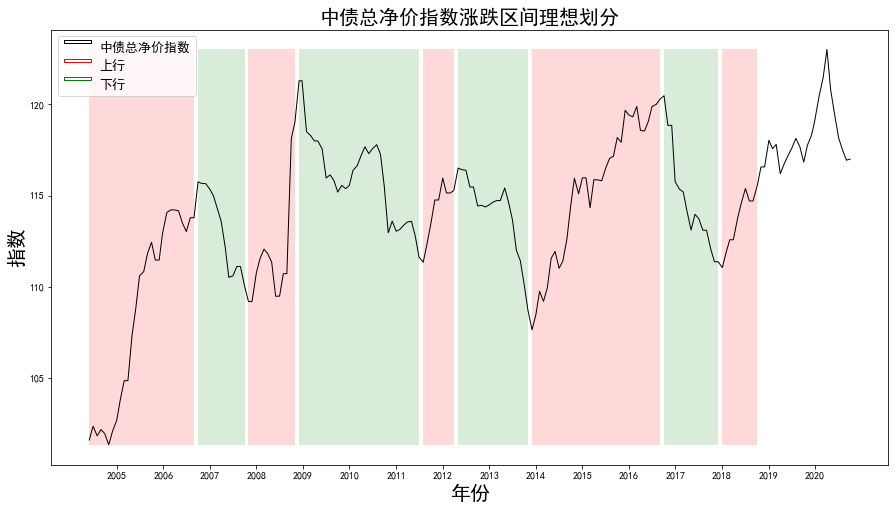

理想年化收益率 1.03


In [24]:
int_list = [['M0020188','股票'],['S0105896','商品'],['M0265832','中债总净价指数'],['G1000116','OECD'],
            ['M0043815','短贷利率'],['M0017126','PMI'],['S0178717','建筑销售面积'],['M5206730','社会融资规模'],
           ['S6110754','乘用车月销量同比'],['M0041341','宏观景气先行'],['M0041340','宏观景气一致'],
            ['M0041342','宏观景气滞后']]

#起止时间
t0 = '2004-06-01'
t1 = '2020-10-01'

#指数取值周期
dic = {'D':'天', 'W':'周', 'M':'月', 'Q':'季度', 'S':'半年', 'Y':'年'}
prd = 'M'

#移动平均线平均时长
l = 12

ind_list = []
for i in int_list:
    ind_list.append(i[0])
    
og = w.wsd(ind_list, 'close', t0, '-1D', Period = prd, Fill = 'Previous')

#训练比例
r = .5

#指数与日期
date, data = date_clean(og.Times, og.Data)
date_s = [str(i) for i in date]

df = []
d8 = date2num(date)
################################    

ud = und(data[2],6,24)
base_cpx = cpx(ud)
    
plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数涨跌区间理想划分',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1, label = '中债总净价指数')

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

collection = collections.BrokenBarHCollection.span_where(
    d8, ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8, ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud) == -1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'red', 'green']
new_legends = ["-"] * len(colors)
markers = ['-'] * len(colors)

_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()
print('理想年化收益率',round(profit(data[2][:-24],ud[:-24]),3))
####################
df = data_pro(data, l, 1)

# 动量指标-12个月移动平均线

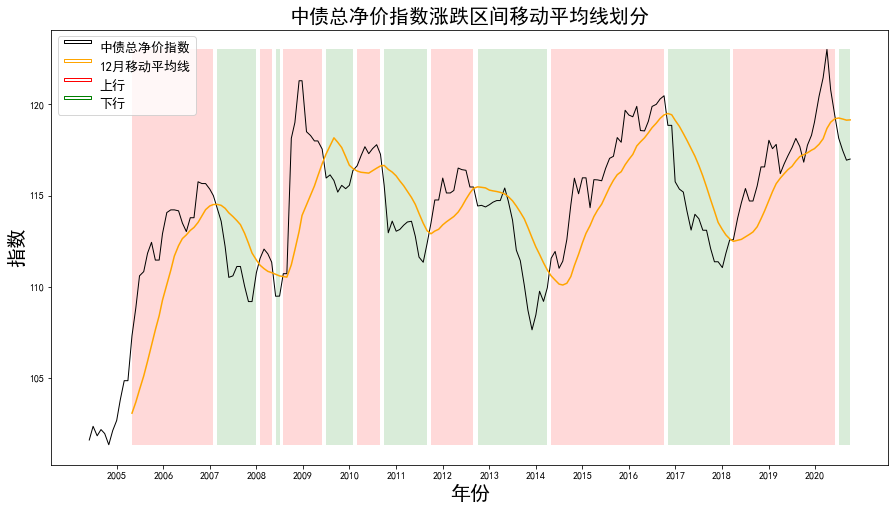

年化收益率 1.013
相对收益率 0.459
准确率 0.656
复杂度 1.483


In [3]:
plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数涨跌区间移动平均线划分',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1, label = '中债总净价指数')
ax.plot(d8[l-1:], ma(data[2],12), color = 'orange', label = '12月移动平均线')

ud_ma = smooth(comp(data[2][l-1:], ma(data[2],12)))

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

collection = collections.BrokenBarHCollection.span_where(
    d8[l-1:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_ma) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8[l-1:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_ma) == -1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'orange', 'red', 'green']
new_legends = ["-"] * len(colors)
markers = ['-'] * len(colors)

_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()

p1 = round(profit(data[2][l-1:], ud_ma),3)
rp1 = round( (profit(data[2][l-1:], ud_ma)-1) /(profit(data[2][l-1:-24], ud[l-1:-24])-1)    ,3)
a1 = round(acc(ud_ma,ud[l-1:]),3)
c1 = round(cpx(ud_ma)/base_cpx,3)

print('年化收益率',p1)
print('相对收益率',rp1)
print('准确率',a1)
print('复杂度',c1)

# OECD综合领先指标

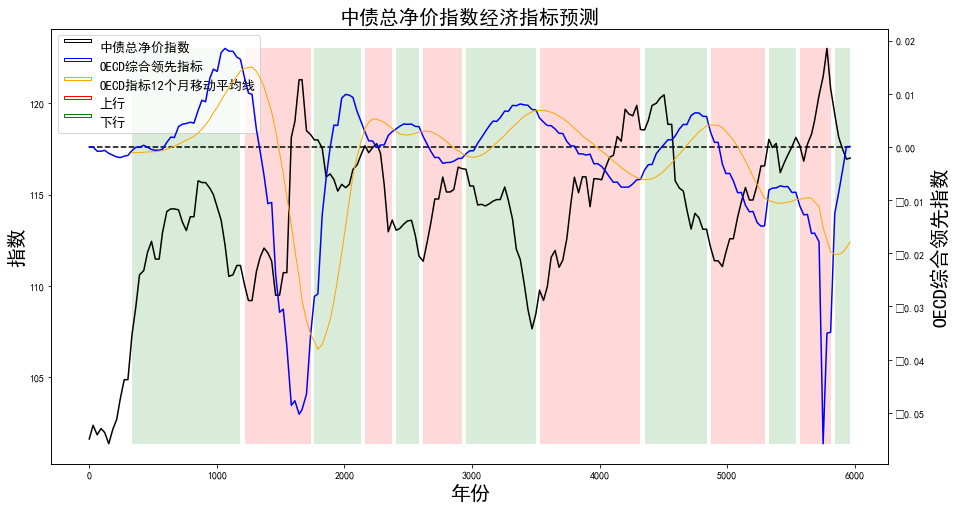

年化收益率 1.014
相对收益率 0.497
准确率 0.645
复杂度 1.377


In [4]:
oecd = std(data[3])
oecd_ma = ma(oecd,12)
ud_oecd = smooth(comp(oecd_ma,oecd[11:]))

plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数经济指标预测',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1.5, label = '中债总净价指数')
ax.plot(d8, data[2], color ='blue', linewidth = 0, label = 'OECD综合领先指标')
ax.plot(d8, data[2], color='orange', linewidth = 0, label = 'OECD指标12个月移动平均线')

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

ax2 = ax.twinx()
ax2.plot(d8, oecd, color='b', linewidth = 1.5, label = 'OECD综合领先指标')
ax2.plot(d8[l-1:], oecd_ma, color='orange', linewidth = 1, label = '12个月移动平均线')
plt.hlines(0, d8[0], d8[-1], ls="--",color="black")

plt.ylabel(u'OECD综合领先指数',fontproperties='SimHei',fontsize = 20)

collection = collections.BrokenBarHCollection.span_where(
    d8[l-1:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_oecd) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8[l-1:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_oecd) != 1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'blue', 'orange','red', 'green']
new_legends = ['-'] * len(colors)
markers = ['-'] * len(colors)

_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()

p2 = round(profit(data[2][l-1:], ud_oecd),3)
rp2 = round(             (profit(data[2][l-1:], ud_oecd)-1)/(profit(data[2][l-1:-24], ud[l-1:-24])-1)                  ,3)
a2 = round(acc(ud_oecd,ud[l-1:]),3)
c2 = round(cpx(ud_oecd)/base_cpx,3)

print('年化收益率', p2)
print('相对收益率', rp2)
print('准确率', a2)
print('复杂度', c2)

# 通货膨胀指标-商品/债券综合指数比例

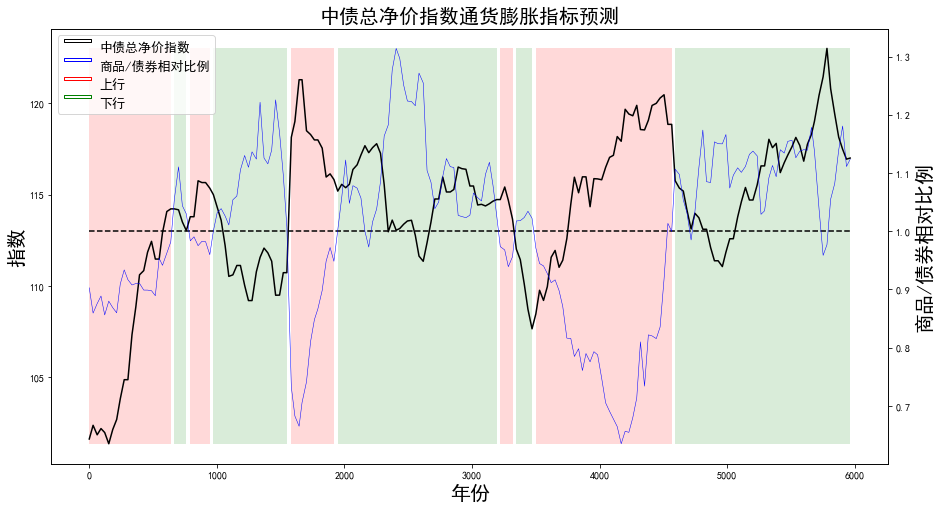

年化收益率 1.009
相对收益率 0.288
准确率 0.594
复杂度 1.0


In [5]:
cb = rel_str(data, 1, 2)
ud_cb = smooth( (-1) ** (np.array(cb >= 1)) )

plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数通货膨胀指标预测',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1.5, label = '中债总净价指数')
ax.plot(d8, data[2], color ='blue', linewidth = 0, label = '商品/债券相对比例')

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

ax2 = ax.twinx()
ax2.plot(d8, cb, color='b', linewidth = .5)
plt.hlines(1, d8[0], d8[-1], ls="--",color="black")

plt.ylabel(u'商品/债券相对比例',fontproperties='SimHei',fontsize = 20)

collection = collections.BrokenBarHCollection.span_where(
    d8, ymin=min(data[2]), ymax=max(data[2]), where=ud_cb == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8, ymin=min(data[2]), ymax=max(data[2]), where=ud_cb == -1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'blue', 'red', 'green']
new_legends = ['-'] * len(colors)
markers = ['-'] * len(colors)

_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()

p3 = round(profit(data[2], ud_cb),3)
rp3 = round(            (profit(data[2], ud_cb)-1)/(profit(data[2][:-24], ud[:-24])-1)         ,3)
a3 = round(acc(ud_cb,ud),3)
c3 = round(cpx(ud_cb)/base_cpx,3)

print('年化收益率', p3)
print('相对收益率', rp3)
print('准确率', a3)
print('复杂度', c3)

# KST确然指标（移动平均线加权）

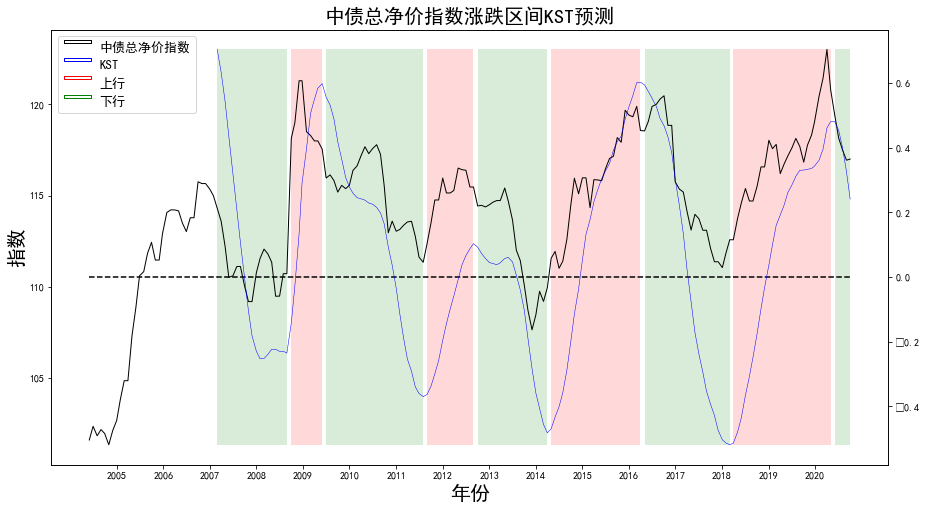

年化收益率 1.009
相对收益率 0.334
准确率 0.628
复杂度 1.081


In [6]:
data_kst = kst(data[2],9,12,18,24,6,6,6,9)
ud_kst = smooth(slope(data_kst))

plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数涨跌区间KST预测',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1, label = '中债总净价指数')
ax.plot(d8, data[2], color='blue', linewidth = 0, label = 'KST')

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

l_kst = len(d8) - len(ud_kst)

ax2 = ax.twinx()
ax2.plot(d8[len(d8) - len(data_kst):], data_kst, color='b', linewidth = .5)
plt.hlines(0, d8[0], d8[-1], ls="--",color="black")

collection = collections.BrokenBarHCollection.span_where(
    d8[l_kst:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_kst) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8[l_kst:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_kst) == -1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'blue','red', 'green']
new_legends = ["-"] * len(colors)
markers = ['-'] * len(colors)

_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()
    
p4 = round(profit(data[2][l_kst:],ud_kst),3)
rp4 = round(       (profit(data[2][l_kst:],ud_kst)-1)/(profit(data[2][l_kst:-24], ud[l_kst:-24])          -1),3)
a4 = round(acc(ud_kst, ud[l_kst:]),3)
c4 = round(cpx(ud_kst)/base_cpx,3)

print('年化收益率', p4)
print('相对收益率', rp4)
print('准确率', a4)
print('复杂度', c4)

# 低通滤波

年化收益率 1.006
相对收益率 0.22
准确率 0.605
复杂度 1.824


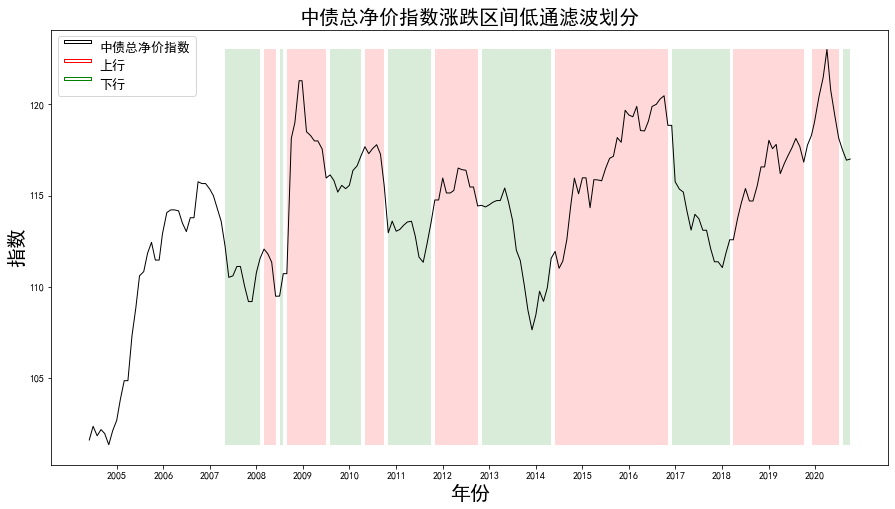

In [7]:
frq = .1
ud_lp = []
for i in range(35,len(date)):
    fdata = signal.filtfilt(signal.butter(8, frq, 'lowpass')[0], signal.butter(8, frq, 'lowpass')[1], data[2][:i])
    ud_lp.append(slope(fdata)[-1])

plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数涨跌区间低通滤波划分',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1, label = '中债总净价指数')

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

collection = collections.BrokenBarHCollection.span_where(
    d8[35:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_lp) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8[35:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_lp) == -1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'red', 'green']
new_legends = ["-"] * len(colors)
markers = ['-'] * len(colors)


_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)


p5 = round(profit(data[2][35:], ud_lp),3)
rp5 = round(             (profit(data[2][35:], ud_lp)-1)/(profit(data[2][35:-24], ud[35:-24])       -1),3)
a5 = round(acc(ud_lp,ud[35:]),3)
c5 = round(cpx(ud_lp)/base_cpx,3)

print('年化收益率',p5)
print('相对收益率',rp5)
print('准确率',a5)
print('复杂度',c5)

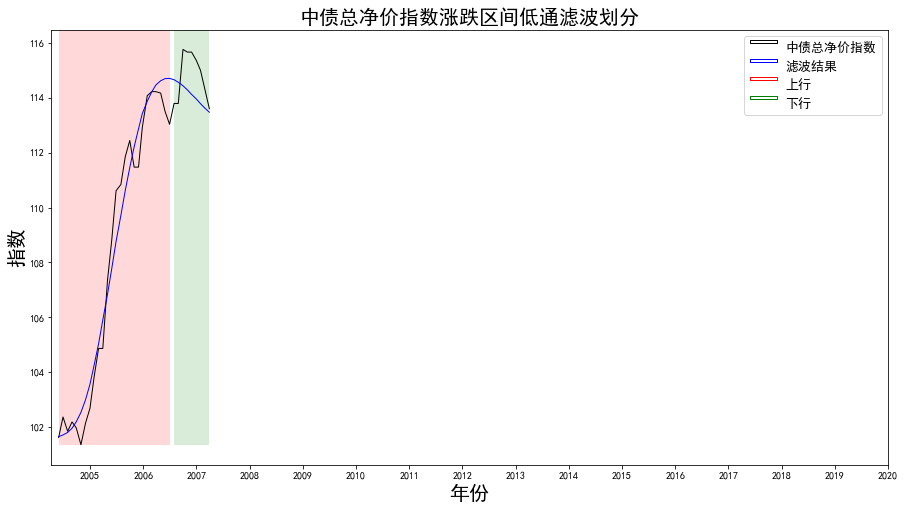

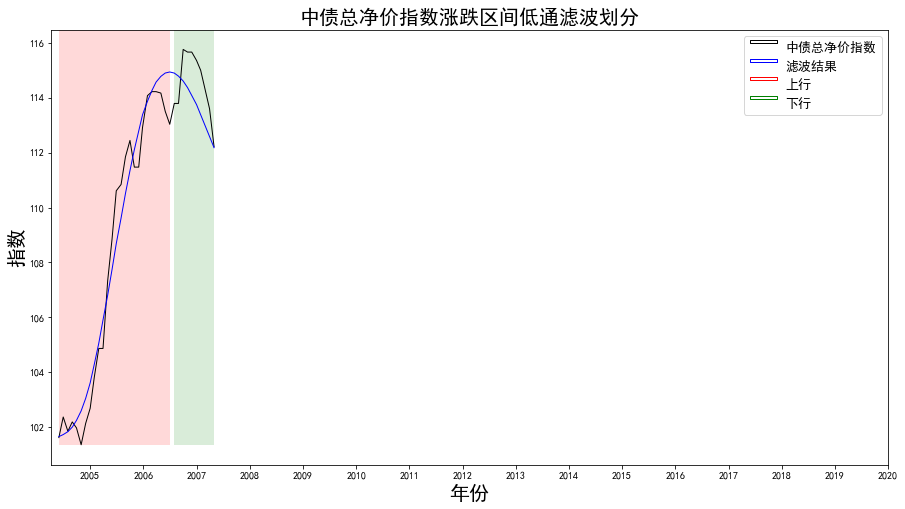

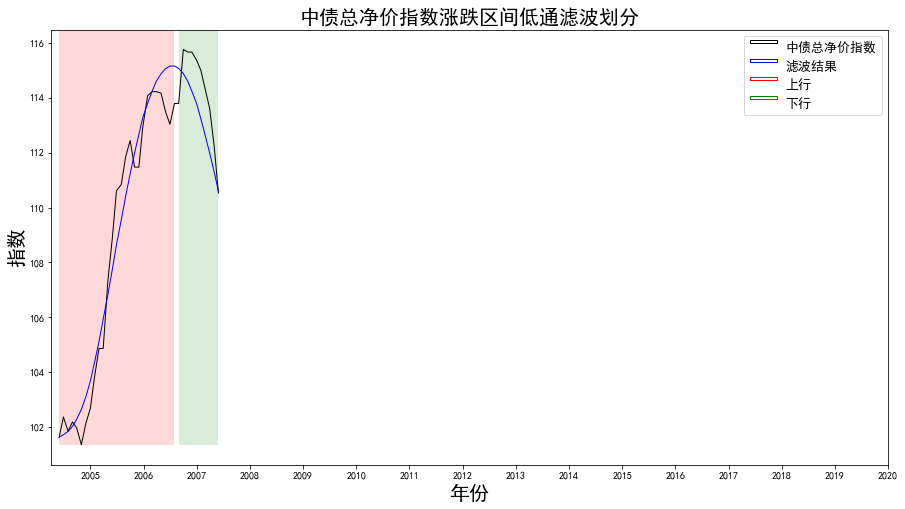

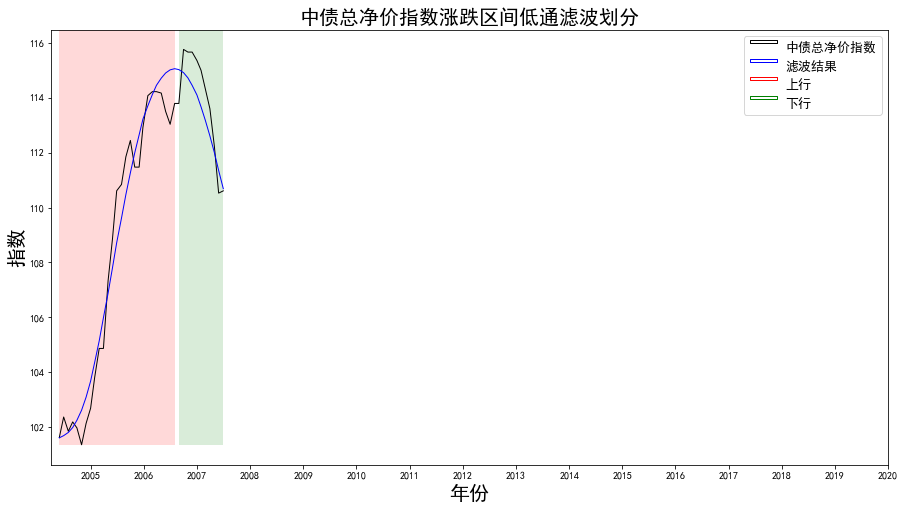

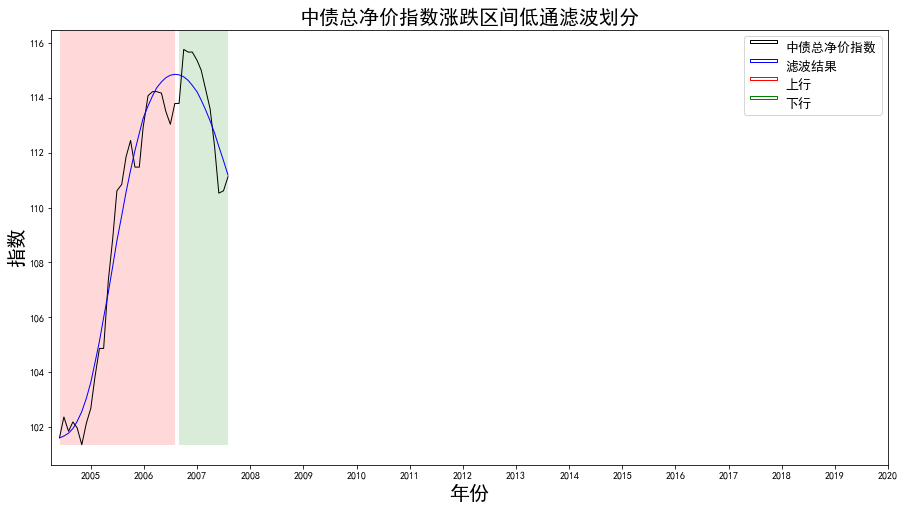

...

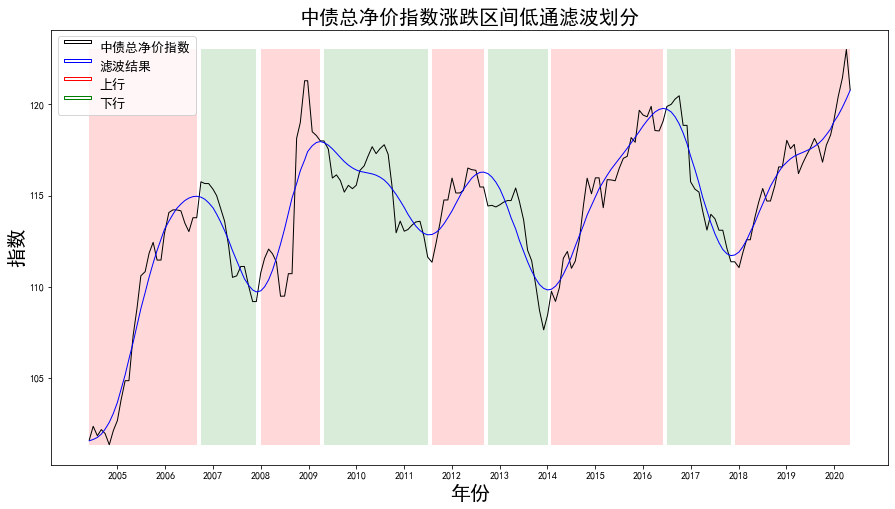

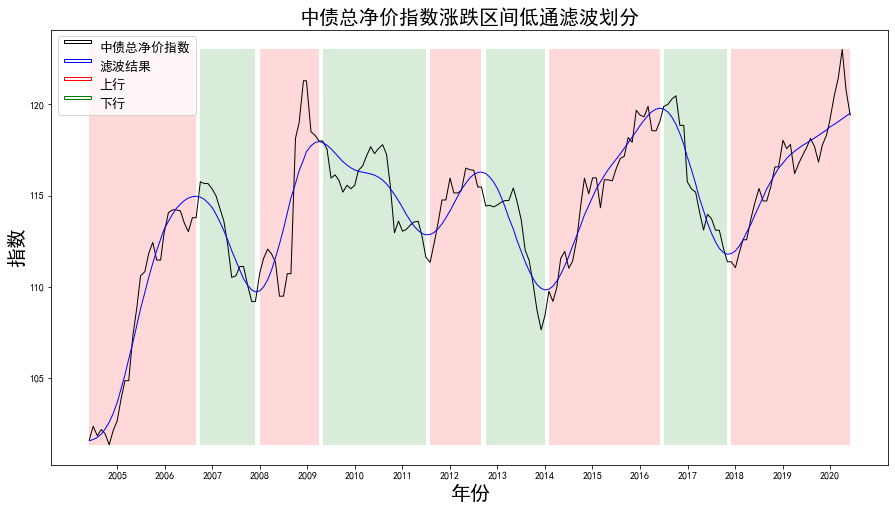

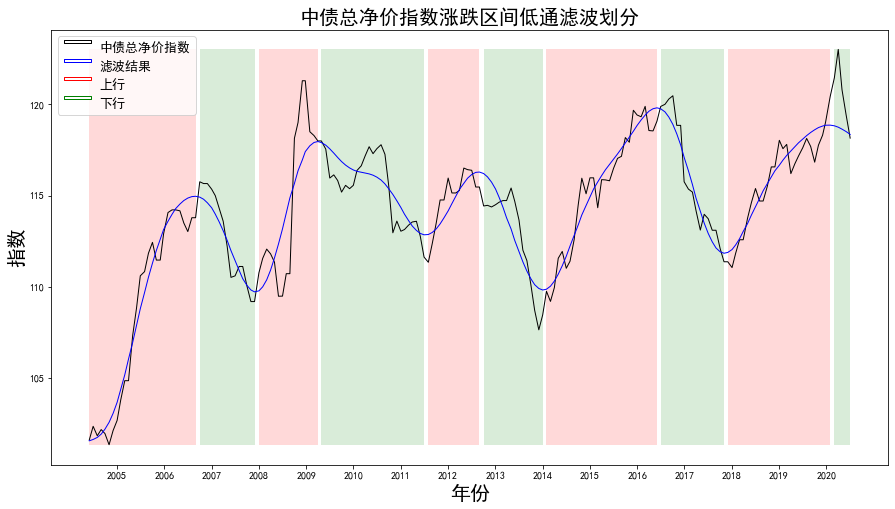

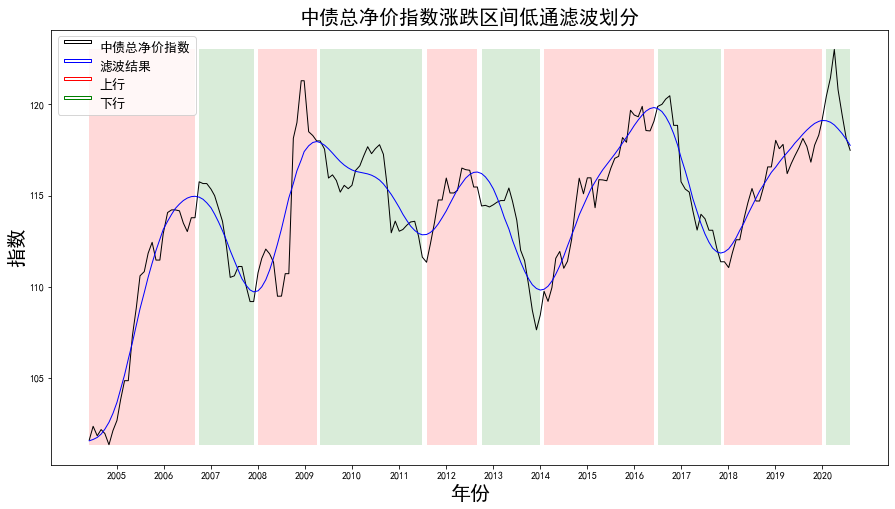

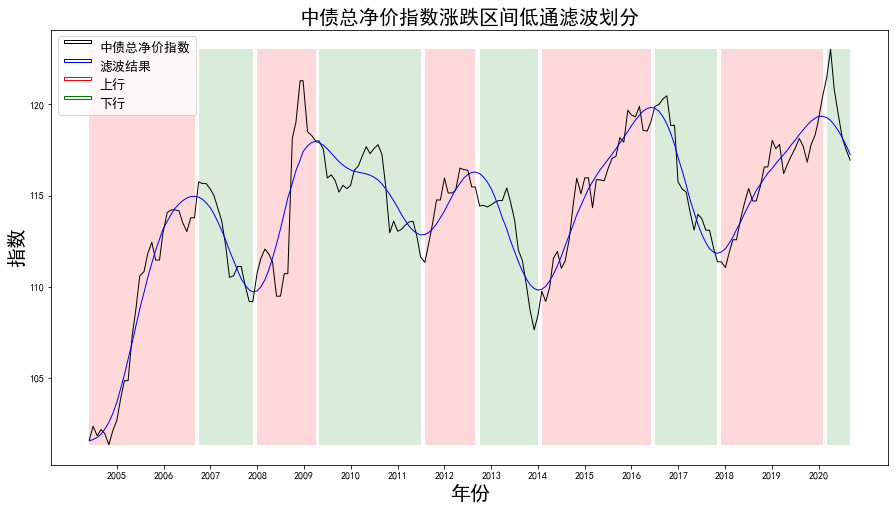

In [8]:
#过程

for i in range(35,len(date)):
    fdata = signal.filtfilt(signal.butter(8, frq, 'lowpass')[0], signal.butter(8, frq, 'lowpass')[1], data[2][:i])
    ud_f = slope(fdata)
    plt.rcParams['font.family']=['SimHei']
    fig, ax = plt.subplots(figsize=(15,8))
    ax.set_title('中债总净价指数涨跌区间低通滤波划分',fontproperties='SimHei', size = 20)
    ax.plot(d8[:i], data[2][:i], color='black', linewidth = 1, label = '中债总净价指数')
    ax.plot(d8[:i], fdata, color='blue', linewidth = 1, label = '滤波结果')
    plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
    plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
    plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)
    collection = collections.BrokenBarHCollection.span_where(
    d8[:i], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_f) == 1, facecolor='red', alpha=.15, label = '上行')
    ax.add_collection(collection)
    collection = collections.BrokenBarHCollection.span_where(
    d8[:i], ymin=min(data[2]), ymax=max(data[2]), where=np.array(ud_f) == -1, facecolor='green', alpha=.15, label = '下行')
    ax.add_collection(collection)

    colors = ['black', 'blue','red', 'green']
    new_legends = ["-"] * len(colors)
    markers = ['-'] * len(colors)
    _, labels = ax.get_legend_handles_labels()
    duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
    ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)
    plt.show()

# 随机森林

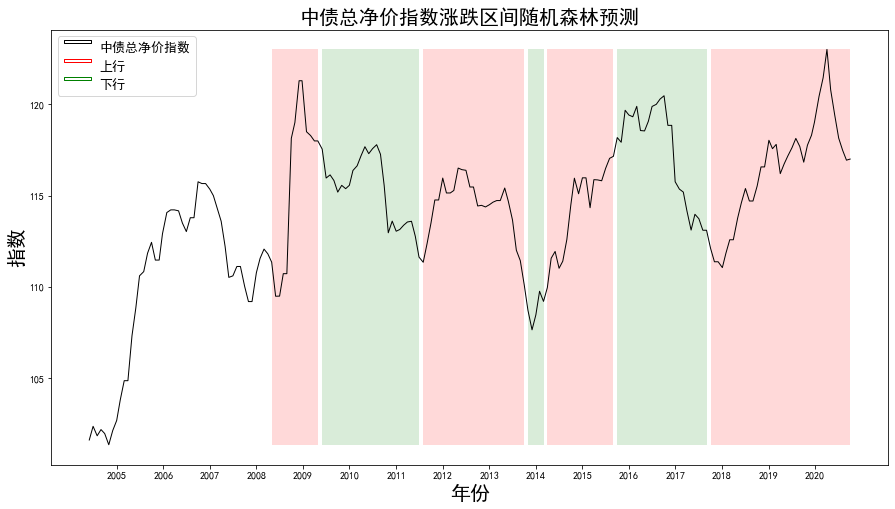

年化收益率 1.012
相对收益率 0.428
准确率 0.659
复杂度 0.919


In [9]:
data_bond = [i[14:21] for i in df]
rf_prd = []
rf = RandomForestRegressor(n_estimators = 100)
for i in range(47,len(date)):
    cur_ud = und(data[2][:i],6,24)
    rf.fit(data_bond[:cur_ud.index(0)-11], cur_ud[11:cur_ud.index(0)])
    rf_prd.append(-(-1)**(sum(np.array(rf.predict(data_bond[cur_ud.index(0)-11:i]))) >= 0)  )


plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数涨跌区间随机森林预测',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1, label = '中债总净价指数')

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

l_rf = len(d8) - len(rf_prd)

collection = collections.BrokenBarHCollection.span_where(
    d8[l_rf:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(rf_prd) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8[l_rf:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(rf_prd) != 1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'red', 'green']
new_legends = ["-"] * len(colors)
markers = ['-'] * len(colors)


_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()
    
p6 = round(profit(data[2][l_rf:],rf_prd),3)
rp6 = round(          (profit(data[2][l_rf:],rf_prd)-1)/(profit(data[2][l_rf:-24], ud[l_rf:-24])    -1)  ,3)
a6 = round(acc(rf_prd[:-24], ud[l_rf:-24]),3)
c6 = round(cpx(rf_prd)/base_cpx,3)

print('年化收益率', p6)
print('相对收益率', rp6)
print('准确率', a6)
print('复杂度', c6)

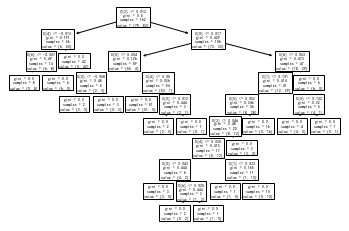

In [10]:
#树的可视化
tre = DecisionTreeClassifier()
tre.fit(data_bond[:-24], ud[11:-24])
tree.plot_tree(tre)
dot_data = tree.export_graphviz(tre, out_file="tre.dot") 

#dot -Tpng tre.dot -o tre.png

# SVM

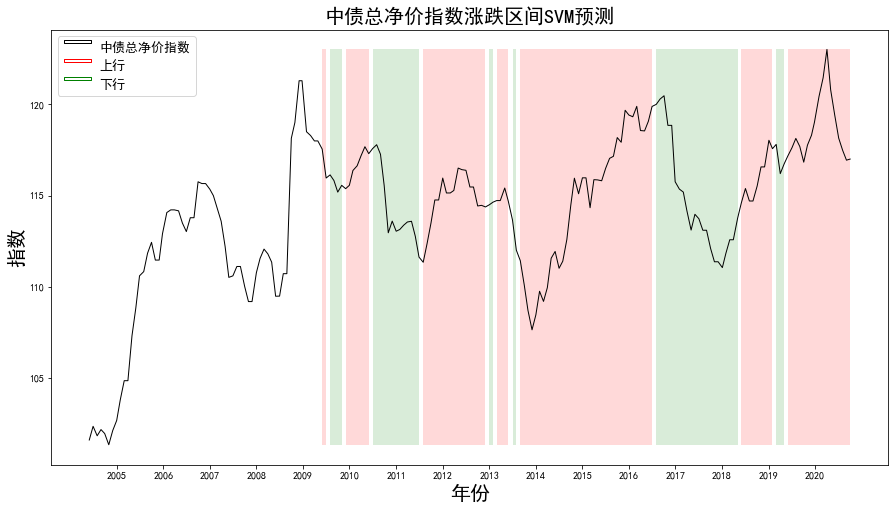

年化收益率 1.011
相对收益率 0.522
准确率 0.726
复杂度 1.869


In [11]:
svm_prd = []
SVM=svm.SVC(C=9,kernel='linear',gamma=10,decision_function_shape='ovr') 
for i in range(47,len(date)):
    cur_ud = und(data[2][:i],6,24)
    if -1 in cur_ud:
        SVM.fit(data_bond[:cur_ud.index(0)-11], cur_ud[11:cur_ud.index(0)])
        svm_prd.append(-SVM.predict(data_bond[cur_ud.index(0)-11:i])[-1])
svm_prd = smooth(svm_prd)    
    
plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数涨跌区间SVM预测',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1, label = '中债总净价指数')

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

l_svm = len(d8) - len(svm_prd)

collection = collections.BrokenBarHCollection.span_where(
    d8[l_svm:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(svm_prd) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8[l_svm:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(svm_prd) != 1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'red', 'green']
new_legends = ["-"] * len(colors)
markers = ['-'] * len(colors)

_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()
    
p7 = round(profit(data[2][l_svm:],svm_prd),3)
rp7 = round(           (profit(data[2][l_svm:],svm_prd)-1)/(profit(data[2][l_svm:-24], ud[l_svm:-24])-1),3)
a7 = round(acc(svm_prd[:-24], ud[l_svm:-24]),3)
c7 = round(cpx(svm_prd)/base_cpx,3)

print('年化收益率', p7)
print('相对收益率', rp7)
print('准确率', a7)
print('复杂度', c7)

# 神经网络

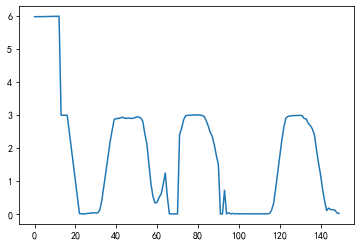

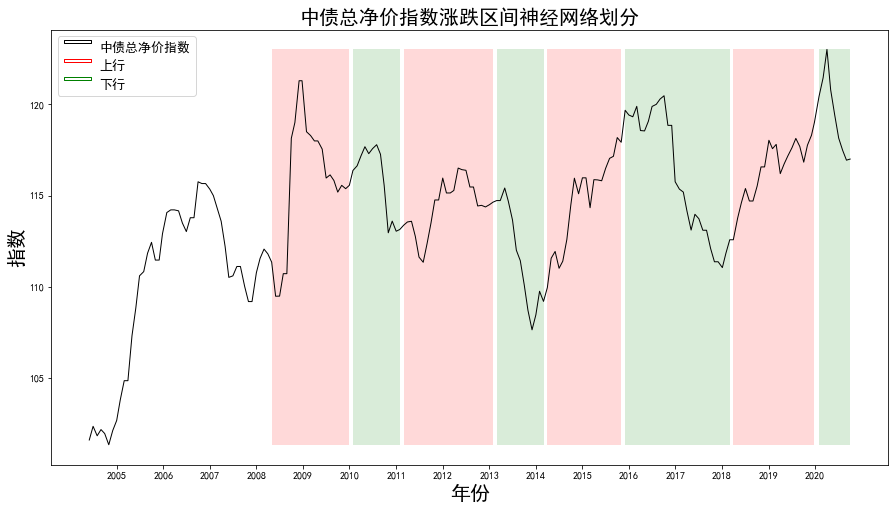

年化收益率 1.017
相对收益率 0.615
准确率 0.635
复杂度 1.051


In [12]:
random.seed(1)
nnet_res = []
for i in range(47,len(date)):
    cur_ud = und(data[2][:i],6,24)
    x = array(data_bond[:cur_ud.index(0)-11])
    y = array([cur_ud[11:cur_ud.index(0)]]).T
    nnet_res.append(sum(calc(data_bond[i-17:i-11], correct(x, y, [1], 5000, 0))[-1]))
plt.plot(nnet_res)
nnet_res = smooth([-(-1) ** (i[0] >= .8) for i in nnet_res])

plt.rcParams['font.family']=['SimHei']
fig, ax = plt.subplots(figsize=(15,8))
ax.set_title('中债总净价指数涨跌区间神经网络划分',fontproperties='SimHei', size = 20)
ax.plot(d8, data[2], color='black', linewidth = 1, label = '中债总净价指数')

l_nnet = len(d8) - len(nnet_res)

plt.xlabel(u'年份',fontproperties='SimHei',fontsize = 20)
plt.xticks([i for i in range(d8[find1y(date)],d8[-1],365)], [date[i].year for i in range(find1y(date),len(d8),12)])
plt.ylabel(u'指数',fontproperties='SimHei',fontsize = 20)

collection = collections.BrokenBarHCollection.span_where(
    d8[l_nnet:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(nnet_res) == 1, facecolor='red', alpha=.15, label = '上行')
ax.add_collection(collection)

collection = collections.BrokenBarHCollection.span_where(
    d8[l_nnet:], ymin=min(data[2]), ymax=max(data[2]), where=np.array(nnet_res) != 1, facecolor='green', alpha=.15, label = '下行')
ax.add_collection(collection)

colors = ['black', 'red', 'green']
new_legends = ["-"] * len(colors)
markers = ['-'] * len(colors)

_, labels = ax.get_legend_handles_labels()

duplicates = [dupe_legend(leg, color) for leg, color in zip(new_legends, colors)]
ax.legend(duplicates, labels, numpoints=1, markerscale=5, fontsize=13)

plt.show()

p8 = round(profit(data[2][l_nnet:],nnet_res),3)
rp8 = round( (profit(data[2][l_nnet:],nnet_res)-1)/(profit(data[2][l_nnet:-24], ud[l_nnet:-24])-1),3)
a8 = round(acc(nnet_res[:-24], ud[l_nnet:-24]),3)
c8 = round(cpx(nnet_res)/base_cpx,3)

print('年化收益率', p8)
print('相对收益率', rp8)
print('准确率', a8)
print('复杂度', c8)

负相关：12个月变化率、12个月内最大波动幅度、当前指数标准化

正相关：标准化移动平均值

In [23]:
calc(data_bond[169:175], correct(x, y, [1], 5000, 1))[:0]

[array([[-66.08250811],
       [-46.38285585],
       [ -9.06428722],
       [ 65.81360223],
       [-56.47223898],
       [ 98.47889089],
       [ 79.98096953]]), array([[-10.12971604]])]


[]

# PCA

# T-sne

# 总结

In [13]:
final_result = []
for i in range(1,9):
    final_result.append([eval('p'+str(i)), eval('rp'+str(i)), eval('a'+str(i)), eval('c'+str(i))])
final_result.append([np.mean([i[0] for i in final_result]),np.mean([i[1] for i in final_result]),np.mean([i[2] for i in final_result]),np.mean([i[3] for i in final_result])])

final_result.append([round(profit(data[2][11:-24], ud[11:-24]),3), 1, 1, 1])
for i in range(len(final_result)):
    for j in range(len(final_result[0])):
        if j == 0:
            final_result[i][j] = str(round((final_result[i][j]-1)*100,1))+'%'
        else:
            final_result[i][j] = round(final_result[i][j],2)
table = pd.DataFrame(final_result, 
            index = ['移动平均线','OECD领先指标', '通货膨胀指标', '确然指标', '低通滤波', '随机森林', 'SVM', '神经网络','以上平均值', '理想状态']
        ,columns=['年化收益率','相对收益率','准确度','复杂度'])
table

,年化收益率,相对收益率,准确度,复杂度
移动平均线,1.3%,0.46,0.66,1.48
OECD领先指标,1.4%,0.50,0.64,1.38
通货膨胀指标,0.9%,0.29,0.59,1.00
确然指标,0.9%,0.33,0.63,1.08
低通滤波,0.6%,0.22,0.60,1.82
随机森林,1.2%,0.43,0.66,0.92
SVM,1.1%,0.52,0.73,1.87
神经网络,1.7%,0.61,0.64,1.05
以上平均值,1.1%,0.42,0.64,1.33
理想状态,2.8%,1.00,1.00,1.00


# 模型所选动量指标

## 12个月变化率

## 12个月内最大波动幅度

## 12个月内反转频率

## 12个月标准化移动平均值

## 标准化当前指数

## 6个月标准化移动平均值

## 9个月标准化移动平均值